In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import torch
import numpy as np
import torchvision.transforms as T

In [3]:
folder = "/content/drive/MyDrive/eagleeye/eagle_eyes_dataset"

In [4]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np

# Load your image
image = Image.open(folder + "//27YAHADN5FNCXXYC_dji_2022-08-30_16-09-31_0523.ann.jpg").convert("RGB")

tile_size = 224

# Calculate padding needed
width, height = image.size
pad_width = (tile_size - width % tile_size) % tile_size
pad_height = (tile_size - height % tile_size) % tile_size

# Pad with white (255, 255, 255)
padded_image = ImageOps.expand(image, border=(0, 0, pad_width, pad_height), fill=(255, 255, 255))
padded_width, padded_height = padded_image.size

# Cut into tiles
tiles = []
for top in range(0, padded_height, tile_size):
    for left in range(0, padded_width, tile_size):
        box = (left, top, left + tile_size, top + tile_size)
        tile = padded_image.crop(box)
        tiles.append(tile)

# Plot the tiles in a grid
cols = padded_width // tile_size
rows = padded_height // tile_size
fig, axs = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

for i in range(rows):
    for j in range(cols):
        axs[i, j].imshow(tiles[i * cols + j])
        axs[i, j].axis("off")

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

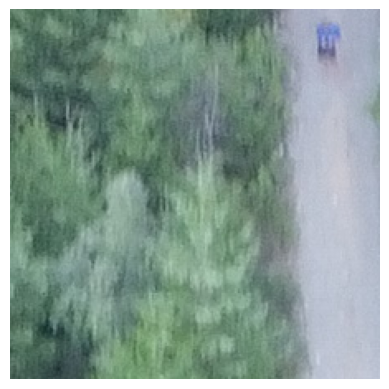

In [5]:
plt.axis("off")
plt.imshow(tiles[44])

In [6]:
test_img = []

for tile in tiles:
    tile = np.asarray(tile)
    normalize = T.Normalize(
          mean=[0.485, 0.456, 0.406],
          std=[0.229, 0.224, 0.225]
        )

    pixel_values = torch.from_numpy(tile.transpose(2, 0, 1)).float() / 255.0
    pixel_values = normalize(pixel_values)
    test_img.append({
            "pixel_values":pixel_values,
            "label": 0
        })

test_img[44]["label"] = 1

<ipython-input-6-756d0b617e78>:10: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:203.)
  pixel_values = torch.from_numpy(tile.transpose(2, 0, 1)).float() / 255.0


In [8]:
from transformers import AutoModelForImageClassification

model_path = "/content/drive/MyDrive/eagleeye/finetuned/checkpoint-624"  # or your local path
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AutoModelForImageClassification.from_pretrained(model_path).to(device)
model.eval()

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=384, out_features=384, bias=True)
              (key): Linear(in_features=384, out_features=384, bias=True)
              (value): Linear(in_features=384, out_features=384, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=384, out_features=384, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=384, out_features=1536, bias=True)
            (intermed

In [9]:
result = []

for img in test_img:
  with torch.no_grad():
        img['pixel_values'] = img['pixel_values'].squeeze()
        img['pixel_values'] = img['pixel_values'].unsqueeze(0).to(device)
        outputs = model(img['pixel_values'])
        pred = torch.argmax(outputs.logits, dim=1).item()
        result.append(pred)

In [10]:
result[44]

1

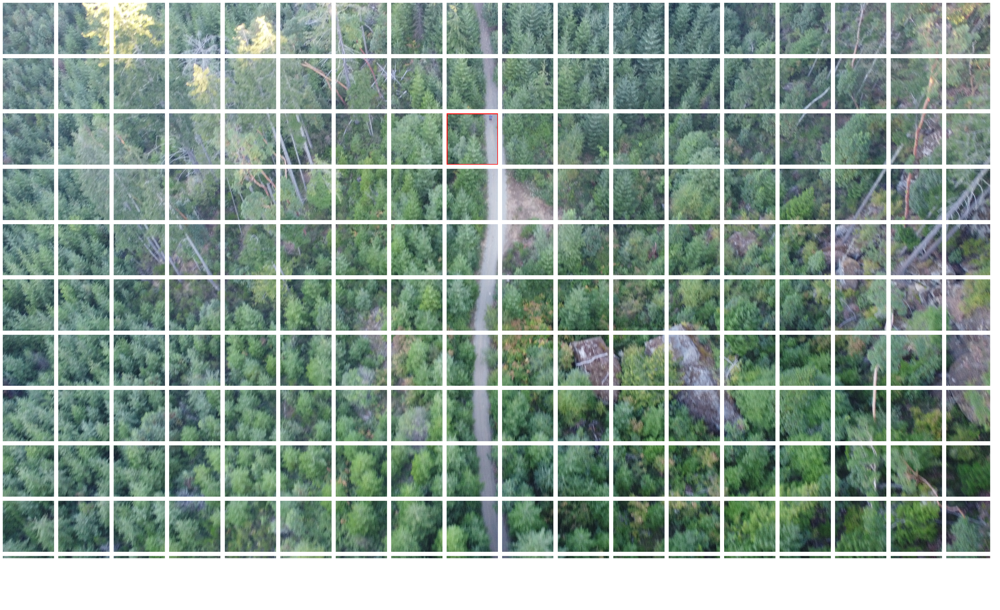

In [11]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Assume:
# - tiles: list of PIL.Image tiles
# - result: list of predicted labels (0 or 1), same length as tiles
# - tile_size = 256
# - cols = number of tiles per row
cols = int(padded_image.width / tile_size)
rows = int(padded_image.height / tile_size)

fig, axs = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

for idx, (tile, pred) in enumerate(zip(tiles, result)):
    row = idx // cols
    col = idx % cols
    ax = axs[row, col]

    ax.imshow(tile)
    ax.axis("off")

    if pred == 1:
        # Add red border
        rect = patches.Rectangle(
            (0, 0), tile.size[0], tile.size[1],
            linewidth=3, edgecolor='red', facecolor='none'
        )
        ax.add_patch(rect)

plt.tight_layout()
plt.show()
